In [1]:
from my_functions import *

#Main Libraries 
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import datetime
import scipy.fftpack
import tensorflow as tf
from tensorflow import keras # And the tf and keras framework, thanks to Google
import scipy.io as io
import sys, os, time
import math
from scipy.fft import fft, fftfreq #Fourier
import pywt # Wavelet

from skimage.restoration import denoise_wavelet #Noise
import matplotlib.patheffects as PathEffects
import seaborn as sns
from sklearn.manifold import TSNE
import time
from tensorflow.python.framework import ops
import networkx as nx #Graph

#Extra Libraries 
from mpl_toolkits import mplot3d
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import MDS
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors
from matplotlib import cm
from scipy.spatial.distance import pdist, squareform
import random
import pandas as pd # data processing, CSV file I/O 
import seaborn as sns #I used sns.distplot because it has more manual properties than plt.hist()
from scipy.stats import pearsonr #includes the PCC function

In [2]:
#---------------------------- READ images and make V1 processing

# File Paths TO SAVED IMAGES BBB OPEN
o_1 = "BBB_OPEN_IMAGES/2018_07_10-1-Results.mat"
o_2 = "BBB_OPEN_IMAGES/2018_07_10-2-Results.mat"
o_3 = "BBB_OPEN_IMAGES/2018_07_10-3-Results.mat"
o_4 = "BBB_OPEN_IMAGES/2018_07_30-1-Results.mat"
o_5 = "BBB_OPEN_IMAGES/2018_07_30-2-Results.mat"
o_6 = "BBB_OPEN_IMAGES/2018_07_30-3-Results.mat"
o_7 = "BBB_OPEN_IMAGES/2018_08_06-1-Results.mat"
o_8 = "BBB_OPEN_IMAGES/2018_09_06-5-Results.mat" 

# File Paths TO SAVED IMAGES BBB NOT OPEN
c_1 = "BBB_NOT_OPEN_IMAGES/2018_07_10-4-Results.mat"
c_2 = "BBB_NOT_OPEN_IMAGES/2018_08_06-3-Results.mat"
c_3 = "BBB_NOT_OPEN_IMAGES/2018_09_05-3-Results.mat"
c_4 = "BBB_NOT_OPEN_IMAGES/2018_09_05-5-Results.mat"
c_5 = "BBB_NOT_OPEN_IMAGES/2018_09_06-4-Results.mat" 

images_to_plot = c_2
#---------------------------- Load Wavelet data with Opening
wavelet_trackdata = io.loadmat(images_to_plot)
wavelet_data = wavelet_trackdata['saved_data'];

max_value_threshold = 0
#---------------------------- remove small images relative to their image group

if (images_to_plot == o_1):
    max_value_threshold = 80
if (images_to_plot == o_2):
    max_value_threshold = 70
if (images_to_plot == o_3):
    max_value_threshold = 70
if (images_to_plot == o_4):
    max_value_threshold = 50
if (images_to_plot == o_5):
    max_value_threshold = 40
if (images_to_plot == o_6):
    max_value_threshold = 40
if (images_to_plot == o_7):
    max_value_threshold = 25
if (images_to_plot == o_8):
    max_value_threshold = 60
if (images_to_plot == c_1):
    max_value_threshold = 30
if (images_to_plot == c_2):
    max_value_threshold = 30
if (images_to_plot == c_3):
    max_value_threshold = 40
if (images_to_plot == c_4):
    max_value_threshold = 40
if (images_to_plot == c_5):
    max_value_threshold = 90
    
wavelet_data_v1 = []
for frame in wavelet_data:
    if (frame.max() > max_value_threshold):
        wavelet_data_v1.append(frame)
wavelet_data_v1 = np.array(wavelet_data_v1)

In [3]:
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
    
# Neural network with one convolutional layer with four filters
class Net(nn.Module):
    
    def __init__(self, weight):
        super(Net, self).__init__()
        # Initializes the weights of the convolutional layer to be the weights of the 4 defined filters
        k_height, k_width = weight.shape[2:]
        # Assumes there are 4 grayscale filters
        self.conv = nn.Conv2d(1, 4, kernel_size=(k_height, k_width), bias=False)
        self.conv.weight = torch.nn.Parameter(weight)

    def forward(self, x):
        # Calculates the output of a convolutional layer pre- and post-activation
        conv_x = self.conv(x)
        activated_x = F.relu(conv_x)
        
        # Returns both layers
        return conv_x, activated_x

def normalize_image(gray_img):
    max_val = gray_img.max()
    for i in range(0,len(gray_img)):
        for j in range(0,len(gray_img[0])):
            gray_img[i,j] = gray_img[i,j] / max_val
    gray_img = np.float32(gray_img)
    return(gray_img)

def Filtered_Image(img,filter_number):
    img_normalized = normalize_image(img)
    
    # Convert the image into an input tensor
    img_tensor = torch.from_numpy(img_normalized).unsqueeze(0).unsqueeze(1)
    
    # Get the convolutional layer (pre and post activation)
    conv_layer, activated_layer = model(img_tensor)
    filtered_img = conv_layer.data[0][filter_number]
    
    return(filtered_img)

def One_Dimention_Tranformation(img):
    nx, ny = img.shape
    img_1d = img.reshape((nx*ny))
    return(img_1d)

Filter shape:  (6, 6)
Net(
  (conv): Conv2d(1, 4, kernel_size=(6, 6), stride=(1, 1), bias=False)
)


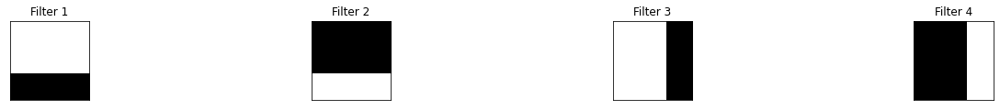

In [4]:
filter_vals = np.array([[1, 1, 1, 1, 1, 1], 
                        [1, 1, 1, 1, 1, 1],
                        [1, 1, 1, 1, 1, 1], 
                        [1, 1, 1, 1, 1, 1],
                        [-1, -1, -1, -1, -1, -1], 
                        [-1, -1, -1, -1, -1, -1]])

#filter_vals = np.array([[-1, -1, 1, 1], [-1, -1, 1, 1], [-1, -1, 1, 1], [-1, -1, 1, 1]])

print('Filter shape: ', filter_vals.shape)

# Define four different filters, all of which are linear combinations of the `filter_vals` defined above
filter_1 = filter_vals
filter_2 = -filter_1
filter_3 = filter_1.T
filter_4 = -filter_3
filters = np.array([filter_1, filter_2, filter_3, filter_4])

fig = plt.figure(figsize=(12, 6))
fig.subplots_adjust(left=0, right=1.5, bottom=0.8, top=1, hspace=0.05, wspace=0.05)
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))

    
# Instantiate the model and set the weights
weight = torch.from_numpy(filters).unsqueeze(1).type(torch.FloatTensor)
model = Net(weight)
# Print out the layer in the network
print(model)

In [5]:
#---------------------------------- tranform the data through filter
wavelet_data_v2 = []
for frame in wavelet_data_v1:
    filtered_frame = Filtered_Image(frame,0)
    wavelet_data_v2.append(frame)
wavelet_data_v2 = np.array(wavelet_data_v2)

In [6]:
wavelet_data_v2_1d = []
for frame in wavelet_data_v2:
    one_dimention_data =  One_Dimention_Tranformation(frame)
    wavelet_data_v2_1d.append(one_dimention_data)
wavelet_data_v2_1d = np.array(wavelet_data_v2_1d)

In [7]:
#---------------------------------- we create our adjacency 2-D matrix
num_data = len(wavelet_data_v2_1d)

adj_mtrx = np.zeros(shape = (num_data,num_data)) #We create a square array of zeros with size the number of images

for i in range(0,num_data):
    one_dimention_data_i =  wavelet_data_v2_1d[i]
    for j in range (i+1,num_data):
        one_dimention_data_j =  wavelet_data_v2_1d[j]

        #----------------- PCC between initial signal reduced signal 
        pcc_value,_ = pearsonr(one_dimention_data_i,one_dimention_data_j)
        if (pcc_value>=0.75):
            adj_mtrx[i,j] = 1  #we only insert 1 if exceeds 80th percentile 
        else:
            adj_mtrx[i,j] = 0

 

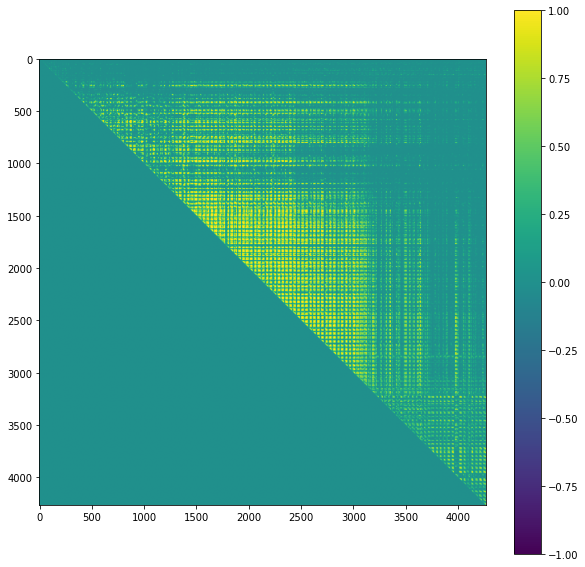

In [40]:
#---------------------------------- with the following code we plot our pcc_array
plt.figure(9, figsize=(10,10))
axes = plt.gca()
plt.imshow(adj_mtrx, vmin = -1, vmax = 1)
plt.colorbar()
plt.show()

In [163]:
def remove_nodes_with_degree_less_than(G,threshold):
    nodes_with_small_degree_list = [1]
    while len(nodes_with_small_degree_list)>0:
    
        for node in nodes_with_small_degree_list:
            G.remove_node(node)
    
        nodes_with_small_degree_list = []
        for node in G.nodes:
            if (G.degree[node]<=threshold):
                nodes_with_small_degree_list.append(node)
        nodes_with_small_degree_list = np.array(nodes_with_small_degree_list)
        print("number of nodes with small degree :",len(nodes_with_small_degree_list))
    return G

In [168]:
#---------------------------------- with the following code we use the networkx and we plot the graph  
num_data = len(wavelet_data_v2_1d)

G = nx.Graph()
for i in range(num_data): #here we add the nodes
    G.add_node(i)

for i in range(num_data): #here we add the edges
    for j in range(num_data):
        if ( adj_mtrx[i,j] ==1): #this the edge [i,j] and [j,i] the networkx library count's it as one, so do not worry!
            G.add_edge(i, j)

#plt.figure(figsize=(50,15))
#plt.subplot(121)
#nx.draw(G, with_labels=True, font_weight='bold')

In [169]:
print(len(list(G.edges)))
print(len(list(G.nodes)))

1660919
4266


In [170]:
G = remove_nodes_with_degree_less_than(G,100)

number of nodes with small degree : 751
number of nodes with small degree : 39
number of nodes with small degree : 5
number of nodes with small degree : 3
number of nodes with small degree : 1
number of nodes with small degree : 0


In [171]:
print(len(list(G.edges)))
print(len(list(G.nodes)))

1636944
3466


In [174]:
print(G.degree(1206))

1262


In [172]:
# We have to set the population attribute for each of the 14 nodes
for node in G.nodes:
    G.nodes[node]['degree'] =  G.degree[node]

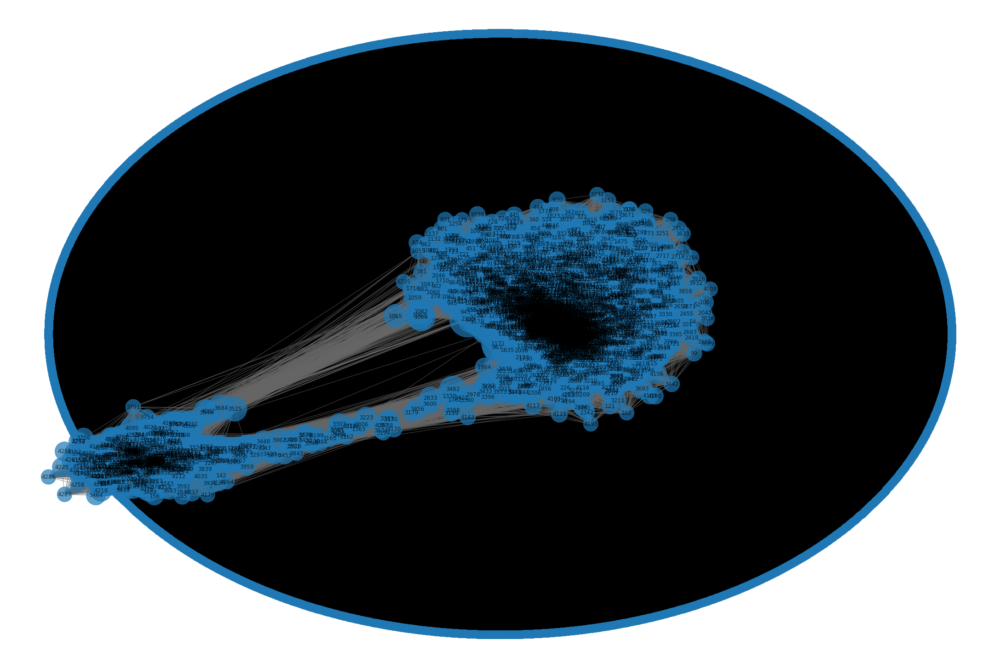

In [173]:
#node_color = [G.degree(v) for v in G]
node_size = [10.0 * nx.get_node_attributes(G, 'degree')[v] for v in G]

plt.figure(figsize =(30, 20))
pos = nx.draw_circular(G)
nx.draw_networkx(G, pos, node_size = node_size, 
				alpha = 0.7,# node_color = node_color, 
				with_labels = True, 
				edge_color ='.4', cmap = plt.cm.Blues)

In [105]:
degree_0_nodes_list = []
for i in range(0,num_data):
    if (G.degree[i]>=1000):
        degree_0_nodes_list.append(i)
degree_0_nodes_list = np.array(degree_0_nodes_list)
print(len(degree_0_nodes_list))     


1660


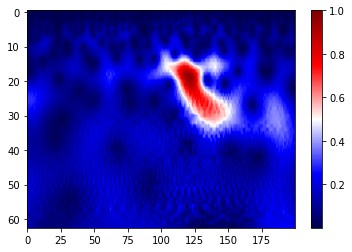

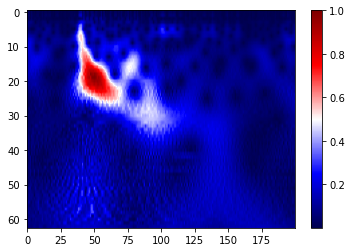

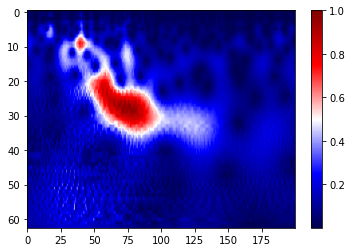

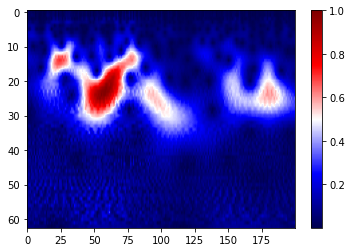

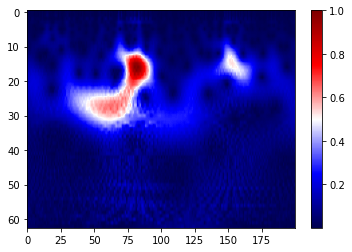

...

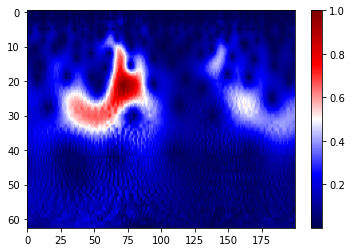

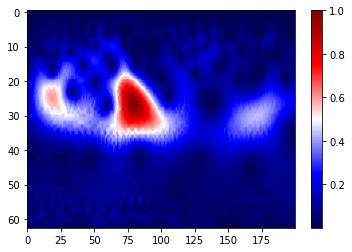

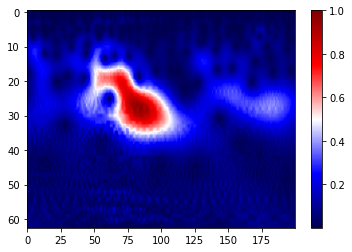

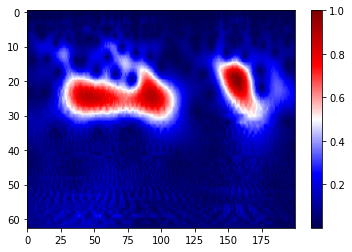

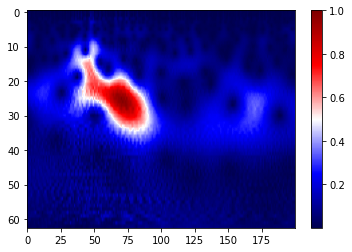

In [18]:
tns1_1d = One_Dimention_Tranformation(wavelet_data_v2[13])

plt.figure(1, figsize=(6,4))
plt.imshow(wavelet_data_v2[13], cmap='seismic', aspect='auto') # seismic gray
plt.colorbar()
plt.show()

for frame in wavelet_data_v2:
    tns2_1d = One_Dimention_Tranformation(frame)
    
    #----------------- PCC between initial signal reduced signal 
    pcc_value,_ = pearsonr(tns1_1d,tns2_1d)
    if (pcc_value<=0.1):
        plt.figure(1, figsize=(6,4))
        plt.imshow(frame, cmap='seismic', aspect='auto') # seismic gray
        plt.colorbar()
        plt.show()